# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [72]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [73]:
obs = conf["obs list"][11]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
print(obs)
vladata.listobs(ms)

19A-056.sb37065331.eb37257531.58740.82100236111
BeginTime
58740.82101851851 

EndTime
58740.975046296306 

IntegrationTime
13308.000001907349 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.7439275295795866}, 'm1': {'unit': 'rad', 'value': 0.5324852109}, 'refer': 'J2000', 'type': 'direction'}
name :  3C286


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.6436723749795865}, 'm1': {'unit': 'rad', 'value': -0.0366673823}, 'refer': 'J2000', 'type': 'direction'}
name :  J1354-0206


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.4912335232795866}, 'm1': {'unit': 'rad', 'value': -0.018827254500000005}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1429-0104


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.489987067279586}, 'm1': {'unit': 'rad', 'value': -0.0006176526000000001}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1429-0002


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad'

### Array Layout

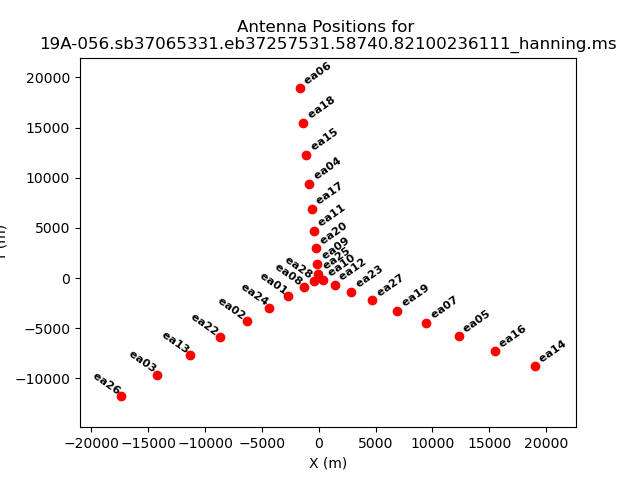

In [74]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

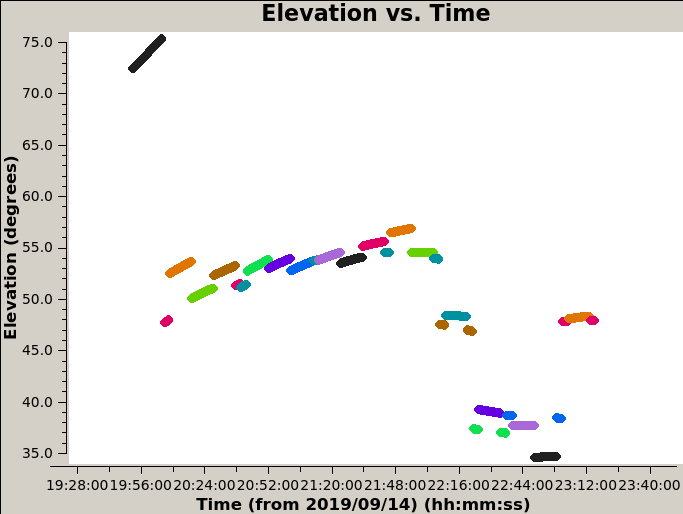

In [75]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [76]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C286
Before: 16.0671, After: 30.5637

field J1354-0206
Before: 25.6844, After: 38.0995

field J1404-0130
Before: 11.3762, After: 26.0967

field J1408-0752
Before: 12.7085, After: 27.2677

field J1432-1801
Before: 12.8116, After: 27.4370

field J1507-1652
Before: 11.9670, After: 26.6681

field J1543-0757
Before: 14.1413, After: 28.4312

field QSO J1344+0128
Before: 5.0193, After: 20.8604

field QSO J1347-0157
Before: 4.7077, After: 20.6005

field QSO J1350-0027
Before: 3.7854, After: 20.0903

field QSO J1416+0015
Before: 3.5214, After: 20.0907

field QSO J1417+0117
Before: 4.6693, After: 20.5673

field QSO J1423-0018
Before: 3.9026, After: 20.0840

field QSO J1425-0015
Before: 5.2790, After: 21.0748

field QSO J1426-0128
Before: 4.8322, After: 20.6930

field QSO J1428-1602
Before: 4.2877, After: 20.2572

field QSO J1429-0002
Before: 3.7798, After: 20.0899

field QSO J1429-0104
Before: 3.7550, After: 20.0850

field QS

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [77]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

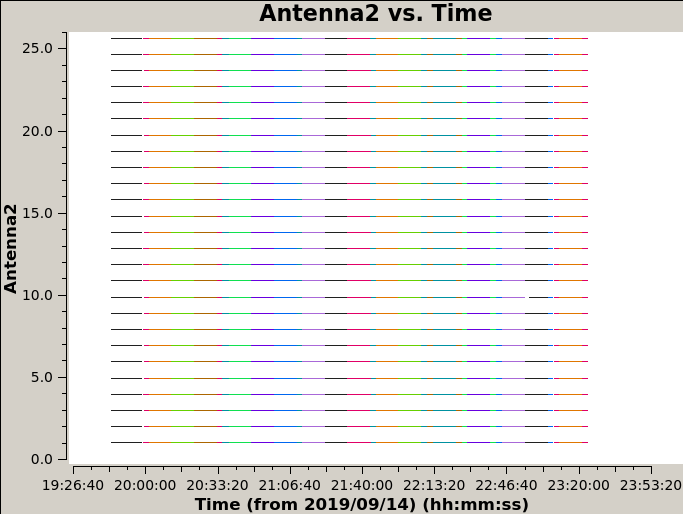

In [78]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [79]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [80]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

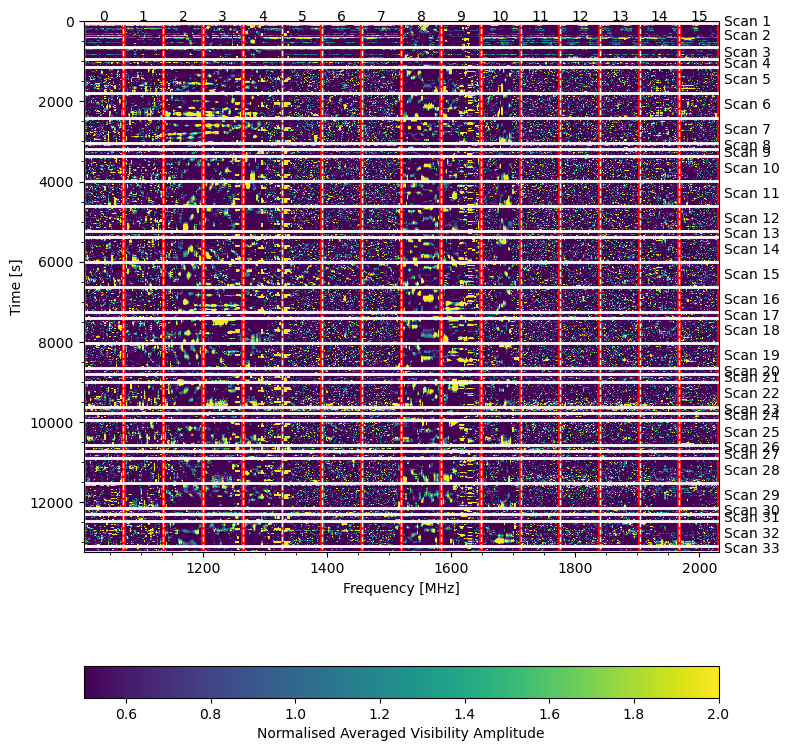

In [81]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [82]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [83]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C286
Before: 65.7191, After: 65.7191

field J1354-0206
Before: 68.5506, After: 68.5506

field J1404-0130
Before: 62.9167, After: 62.9167

field J1408-0752
Before: 62.3991, After: 62.3991

field J1432-1801
Before: 64.7371, After: 64.7371

field J1507-1652
Before: 63.9150, After: 63.9150

field J1543-0757
Before: 62.5086, After: 62.5086

field QSO J1344+0128
Before: 59.3068, After: 59.3068

field QSO J1347-0157
Before: 59.4420, After: 59.4420

field QSO J1350-0027
Before: 58.4957, After: 58.4957

field QSO J1416+0015
Before: 60.2532, After: 60.2532

field QSO J1417+0117
Before: 58.7661, After: 58.7661

field QSO J1423-0018
Before: 59.0365, After: 59.0365

field QSO J1425-0015
Before: 59.8276, After: 59.8276

field QSO J1426-0128
Before: 58.9013, After: 58.9013

field QSO J1428-1602
Before: 59.3958, After: 59.3958

field QSO J1429-0002
Before: 58.0901, After: 58.0901

field QSO J1429-0104
Before: 58.3605, After: 58.3605

fiel

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [84]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 17.15, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 16.70, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 16.27, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 15.86, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 15.49, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 15.13, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 14.79, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 14.47, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.16, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 13.87, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.60, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.34, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 13.09, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.85, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.62, U: 0.00, V: 0.00, Q: 0.00


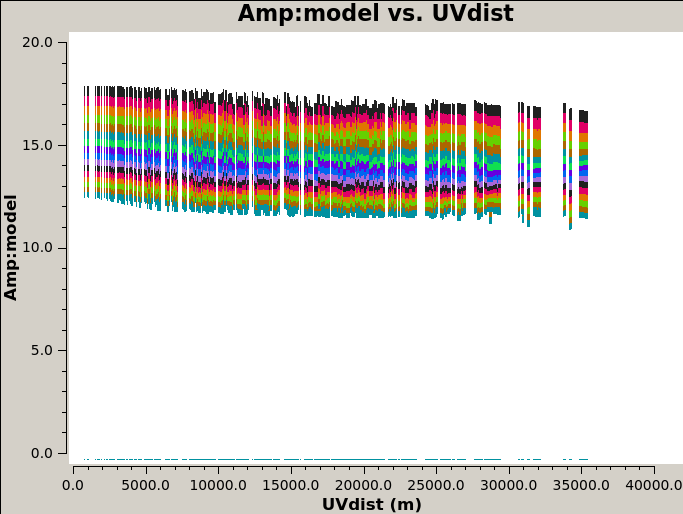

In [85]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

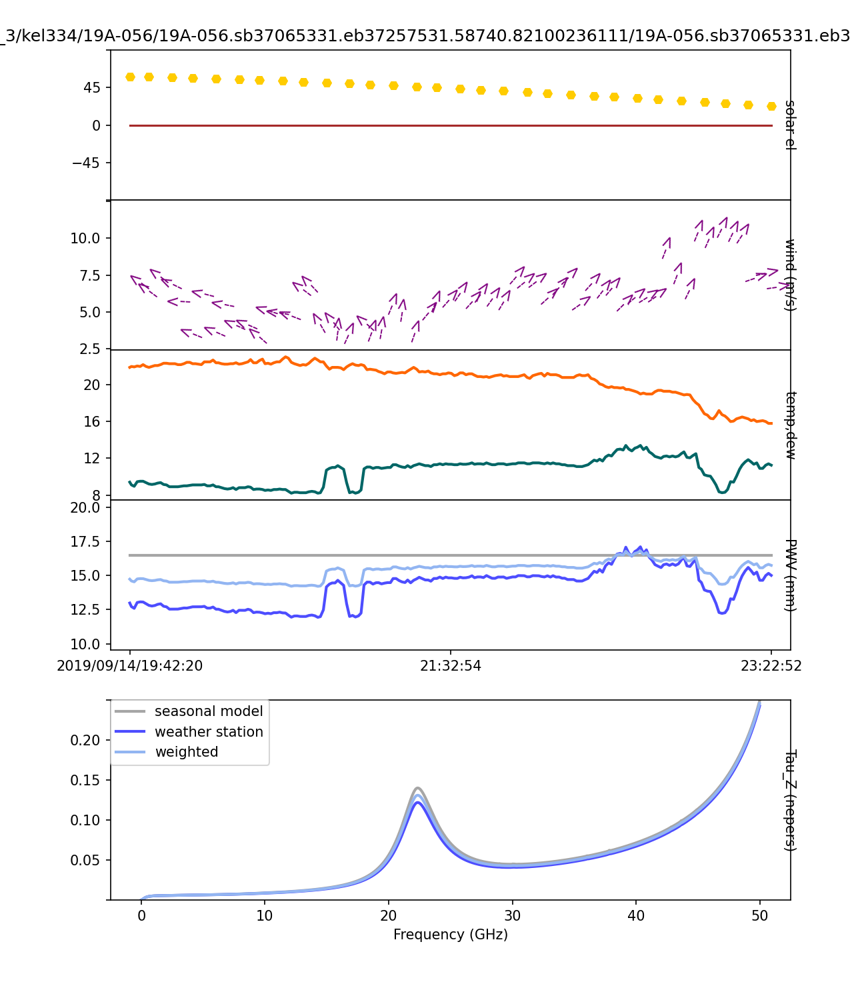

In [86]:
Image(filename=root + "/plots/calplots/weather.png")

In [87]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.005155815809543294
SPW 1: 0.005215990532249339
SPW 2: 0.0052683882945999015
SPW 3: 0.005314233997701186
SPW 4: 0.005354965605922774
SPW 5: 0.005391180291516868
SPW 6: 0.005423809472361395
SPW 7: 0.005453327730110514
SPW 8: 0.005480264598487949
SPW 9: 0.005505027005488039
SPW 10: 0.005527905362113627
SPW 11: 0.005549246687356646
SPW 12: 0.005569199710150525
SPW 13: 0.005588043954782577
SPW 14: 0.0056058901631944194
SPW 15: 0.005622916908449433


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

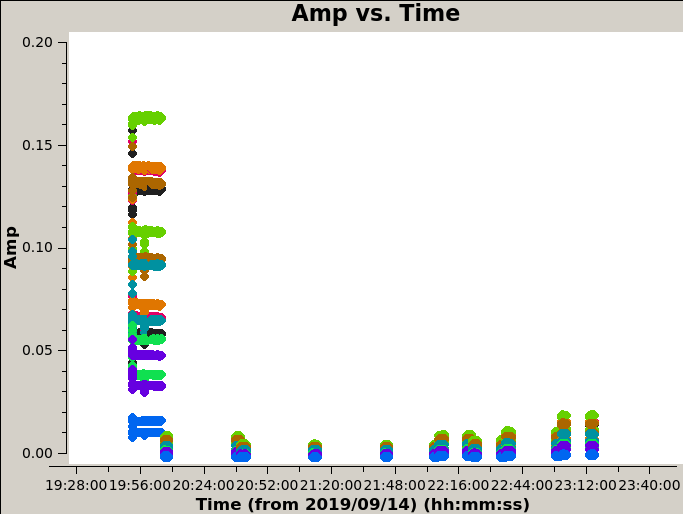

In [88]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [89]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [90]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_0 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [91]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

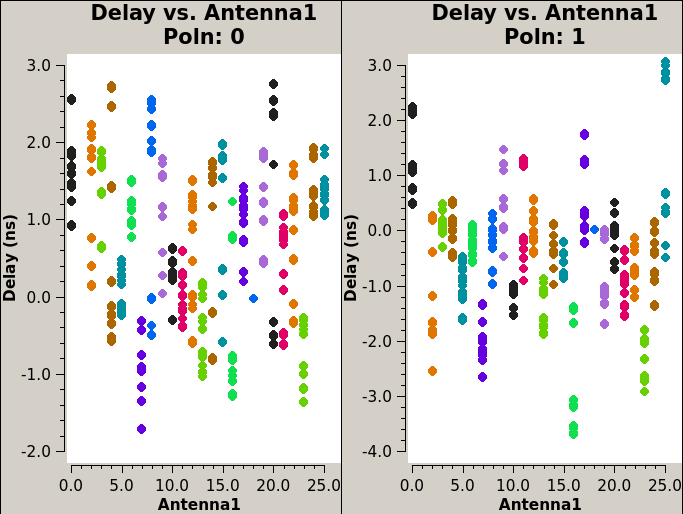

In [92]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [93]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_0}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_0}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [94]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [95]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

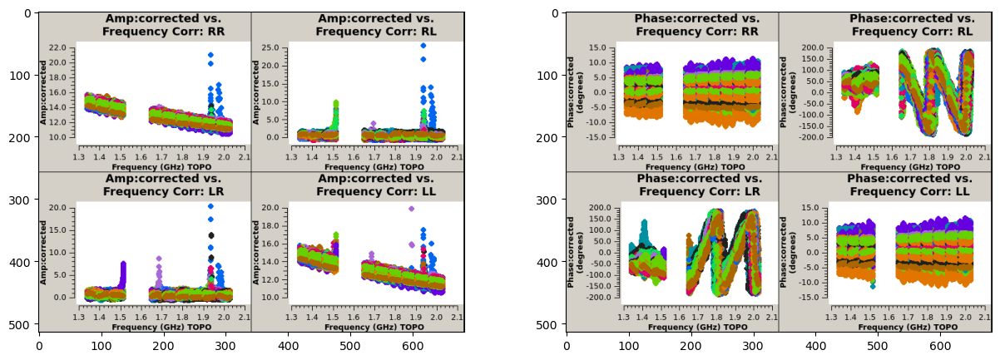

In [96]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [97]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [98]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C286
Before: 34.6416, After: 65.7191

antenna ea01
Before: 31.1755, After: 62.7860

antenna ea02
Before: 100.0000, After: 100.0000

antenna ea03
Before: 31.1775, After: 62.7860

antenna ea04
Before: 31.1811, After: 62.7860

antenna ea05
Before: 31.1755, After: 62.7860

antenna ea06
Before: 31.1891, After: 62.7860

antenna ea07
Before: 31.1775, After: 62.7860

antenna ea08
Before: 31.1811, After: 62.7860

antenna ea09
Before: 31.1755, After: 62.7860

antenna ea10
Before: 31.1891, After: 62.7860

antenna ea11
Before: 31.1775, After: 62.7860

antenna ea12
Before: 31.1811, After: 62.7860

antenna ea13
Before: 31.1755, After: 62.7860

antenna ea14
Before: 31.1891, After: 62.7860

antenna ea15
Before: 31.1775, After: 62.7860

antenna ea16
Before: 35.2402, After: 66.8452

antenna ea17
Before: 31.1755, After: 62.7860

antenna ea18
Before: 31.5421, After: 63.1390

antenna ea19
Before: 31.1775, After: 62.7860

antenna

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

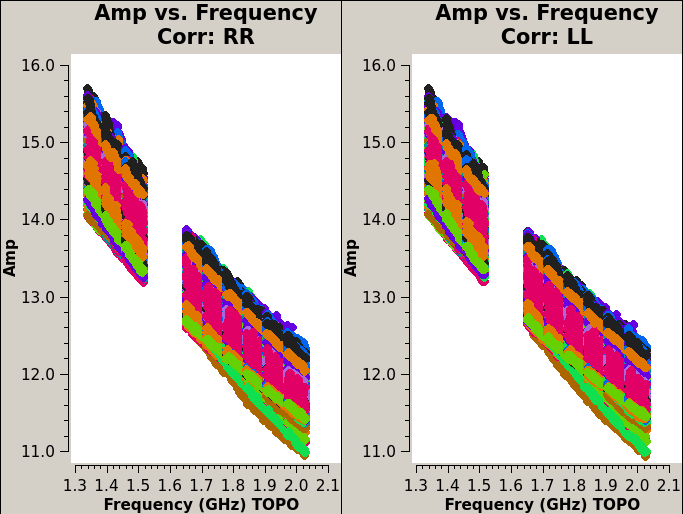

In [99]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

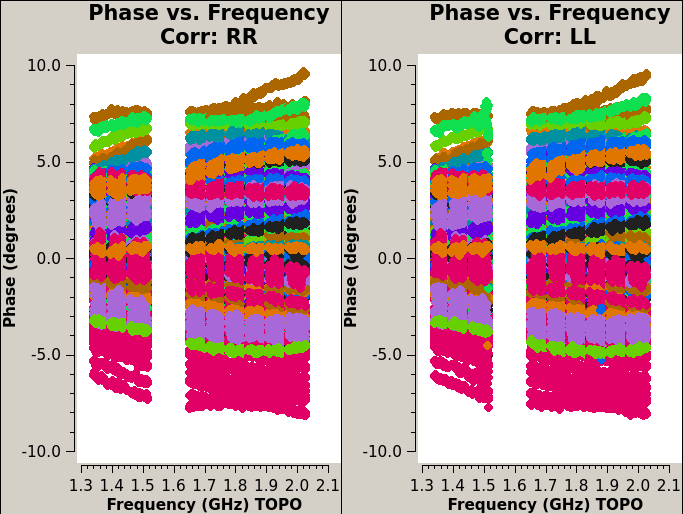

In [100]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

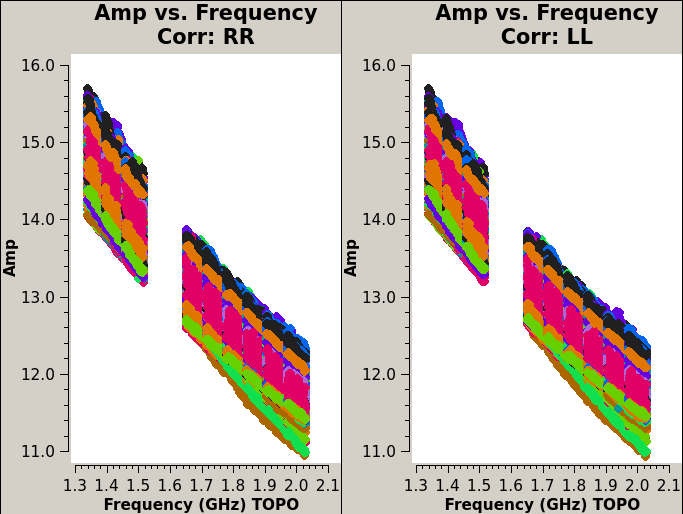

In [101]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

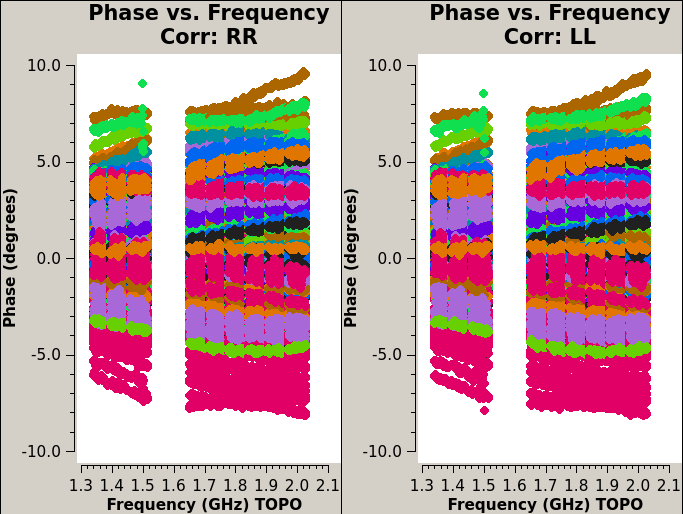

In [102]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [103]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 65.7191, After: 65.8915

antenna ea01
Before: 62.7860, After: 62.8671

antenna ea02
Before: 100.0000, After: 100.0000

antenna ea03
Before: 62.7860, After: 62.8502

antenna ea04
Before: 62.7860, After: 62.8843

antenna ea05
Before: 62.7860, After: 62.8532

antenna ea06
Before: 62.7860, After: 62.8747

antenna ea07
Before: 62.7860, After: 62.8467

antenna ea08
Before: 62.7860, After: 62.8455

antenna ea09
Before: 62.7860, After: 63.0287

antenna ea10
Before: 62.7860, After: 63.0195

antenna ea11
Before: 62.7860, After: 62.8797

antenna ea12
Before: 62.7860, After: 62.9518

antenna ea13
Before: 62.7860, After: 62.8494

antenna ea14
Before: 62.7860, After: 62.8826

antenna ea15
Before: 62.7860, After: 62.8619

antenna ea16
Before: 66.8452, After: 66.9063

antenna ea17
Before: 62.7860, After: 62.9140

antenna ea18
Before: 63.1390, After: 64.9422

antenna ea19
Before: 62.7860, After: 62.8557

antenn

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [104]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_1 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [105]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

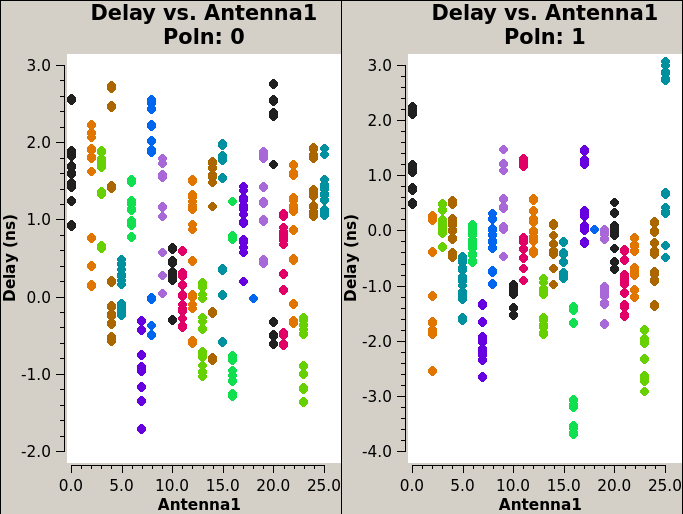

In [106]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [107]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_1}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_1}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [108]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [109]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [110]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C286
Before: 65.8915, After: 65.8915

antenna ea01
Before: 62.8671, After: 62.8671

antenna ea02
Before: 100.0000, After: 100.0000

antenna ea03
Before: 62.8502, After: 62.8502

antenna ea04
Before: 62.8843, After: 62.8843

antenna ea05
Before: 62.8532, After: 62.8532

antenna ea06
Before: 62.8747, After: 62.8747

antenna ea07
Before: 62.8467, After: 62.8470

antenna ea08
Before: 62.8455, After: 62.8455

antenna ea09
Before: 63.0287, After: 63.0287

antenna ea10
Before: 63.0195, After: 63.0195

antenna ea11
Before: 62.8797, After: 62.8797

antenna ea12
Before: 62.9518, After: 62.9518

antenna ea13
Before: 62.8494, After: 62.8494

antenna ea14
Before: 62.8826, After: 62.8826

antenna ea15
Before: 62.8619, After: 62.8619

antenna ea16
Before: 66.9063, After: 66.9063

antenna ea17
Before: 62.9140, After: 62.9140

antenna ea18
Before: 64.9422, After: 64.9425

antenna ea19
Before: 62.8557, After: 62.8557

antenna

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

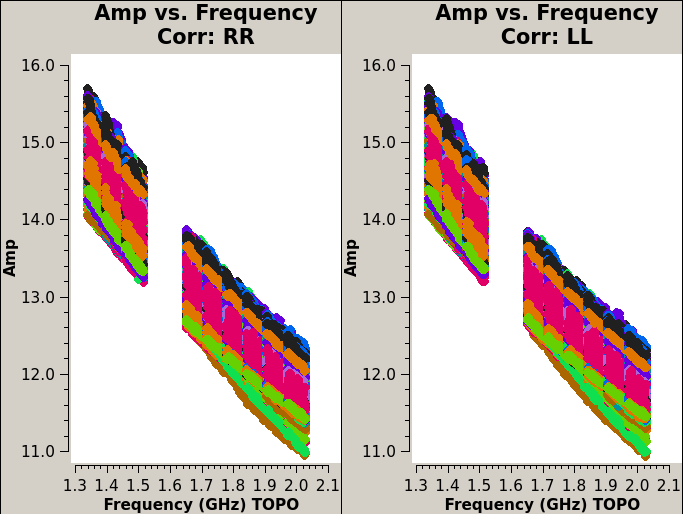

In [111]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

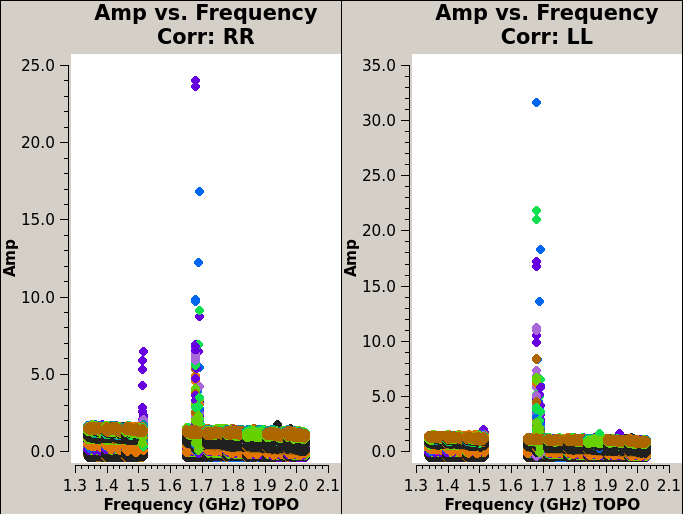

In [112]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

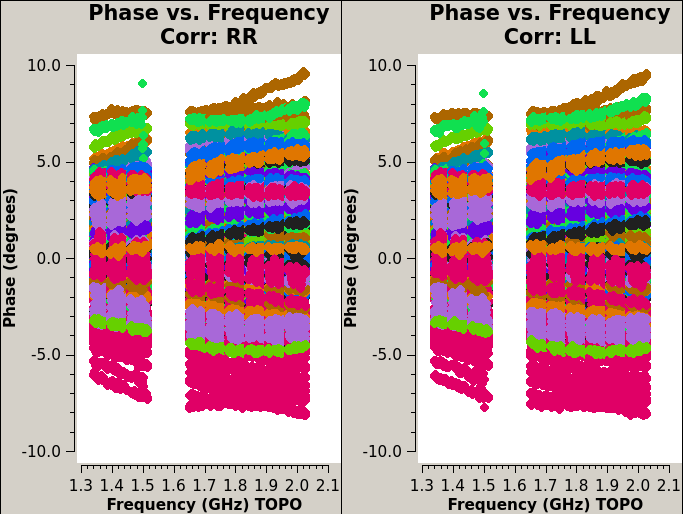

In [113]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

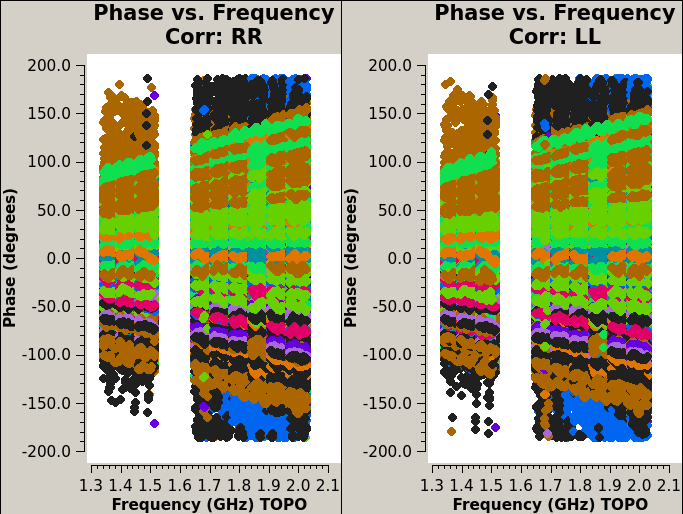

In [114]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

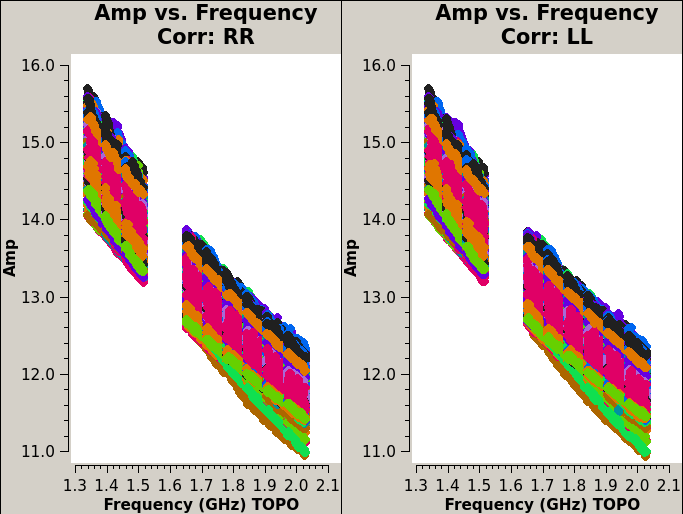

In [115]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

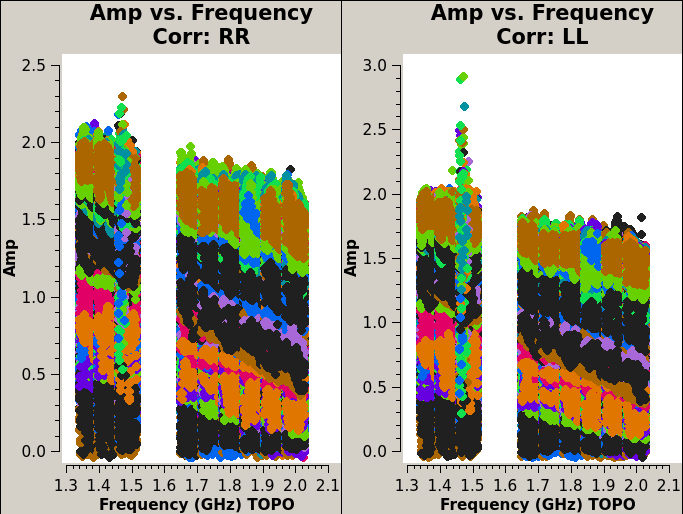

In [116]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

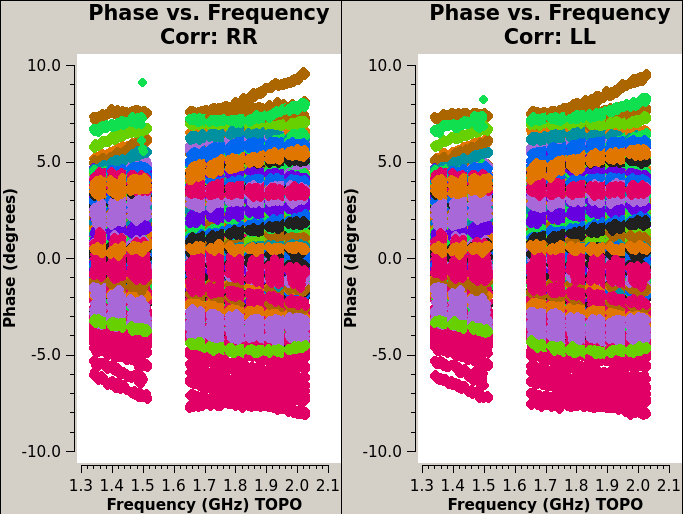

In [117]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

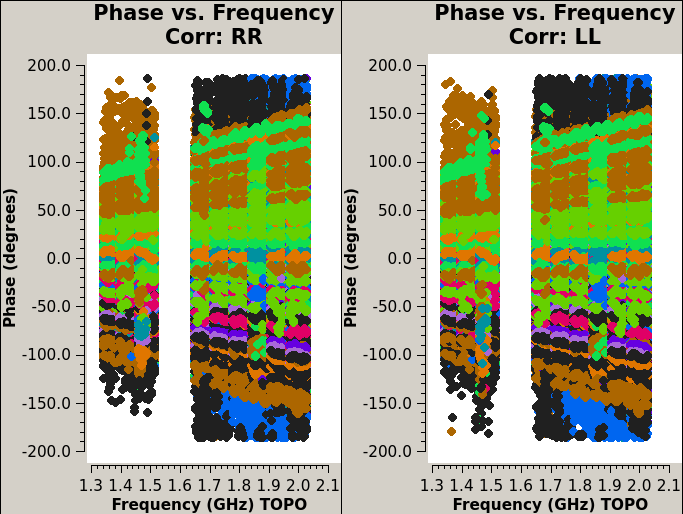

In [118]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [119]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 65.8915, After: 65.9341

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 66.3707, After: 66.4117

scan 3
Before: 58.7524, After: 58.8057

antenna ea01
Before: 62.8671, After: 62.9145

antenna ea02
Before: 100.0000, After: 100.0000

antenna ea03
Before: 62.8502, After: 62.8726

antenna ea04
Before: 62.8843, After: 62.9446

antenna ea05
Before: 62.8532, After: 62.8817

antenna ea06
Before: 62.8747, After: 62.9360

antenna ea07
Before: 62.8470, After: 62.8656

antenna ea08
Before: 62.8455, After: 62.8639

antenna ea09
Before: 63.0287, After: 63.1036

antenna ea10
Before: 63.0195, After: 63.0772

antenna ea11
Before: 62.8797, After: 62.9340

antenna ea12
Before: 62.9518, After: 63.0600

antenna ea13
Before: 62.8494, After: 62.8662

antenna ea14
Before: 62.8826, After: 62.9293

antenna ea15
Before: 62.8619, After: 62.8971

antenna ea16
Before: 66.9063, After: 66.9314

antenna ea17
Before: 6

In [120]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J1354-0206
Before: 68.6149, After: 69.5719

field J1404-0130
Before: 62.9928, After: 64.0907

field J1408-0752
Before: 62.4763, After: 63.6209

field J1432-1801
Before: 64.8094, After: 65.6577

field J1507-1652
Before: 63.9890, After: 64.8601

field J1543-0757
Before: 62.5856, After: 64.3006

scan 13
Before: 63.4779, After: 64.6232

scan 17
Before: 62.6806, After: 63.7207

scan 20
Before: 64.0486, After: 65.0318

scan 21
Before: 62.0416, After: 63.2343

scan 23
Before: 62.9991, After: 64.0859

scan 24
Before: 64.8885, After: 65.7339

scan 26
Before: 64.7130, After: 65.5649

scan 27
Before: 64.4140, After: 65.2723

scan 30
Before: 63.4779, After: 64.3643

scan 31
Before: 64.1414, After: 65.8148

scan 33
Before: 60.7144, After: 62.4795

scan 4
Before: 75.1124, After: 75.7377

scan 8
Before: 59.4833, After: 60.9063

scan 9
Before: 61.9712, After: 63.1731

antenna ea01
Before: 60.9890, After: 62.1534

antenna 

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [121]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}.fluxscale"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [122]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

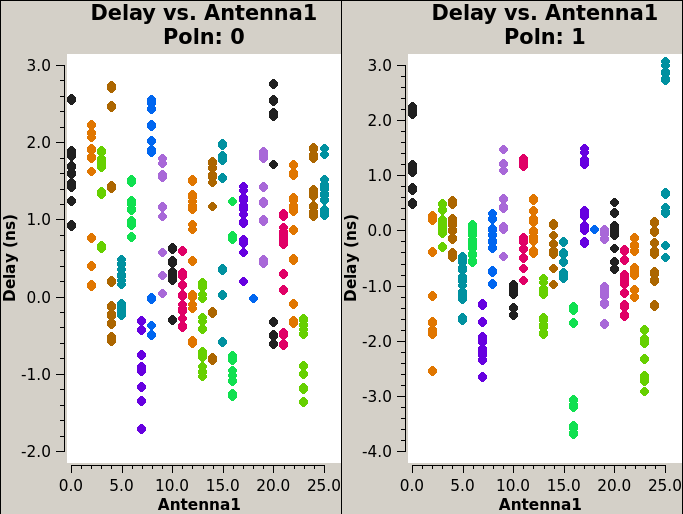

In [123]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [124]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [125]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [126]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [127]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [128]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [129]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )
interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [130]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [131]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C286
Before: 65.8915, After: 65.8915

antenna ea01
Before: 62.8671, After: 62.8671

antenna ea02
Before: 100.0000, After: 100.0000

antenna ea03
Before: 62.8502, After: 62.8502

antenna ea04
Before: 62.8843, After: 62.8843

antenna ea05
Before: 62.8532, After: 62.8532

antenna ea06
Before: 62.8747, After: 62.8747

antenna ea07
Before: 62.8467, After: 62.8470

antenna ea08
Before: 62.8455, After: 62.8455

antenna ea09
Before: 63.0287, After: 63.0287

antenna ea10
Before: 63.0195, After: 63.0195

antenna ea11
Before: 62.8797, After: 62.8797

antenna ea12
Before: 62.9518, After: 62.9518

antenna ea13
Before: 62.8494, After: 62.8494

antenna ea14
Before: 62.8826, After: 62.8826

antenna ea15
Before: 62.8619, After: 62.8619

antenna ea16
Before: 66.9063, After: 66.9063

antenna ea17
Before: 62.9140, After: 62.9140

antenna ea18
Before: 64.9422, After: 64.9425

antenna ea19
Before: 62.8557, After: 62.8557

In [132]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C286
Before: 65.9341, After: 65.9727

field J1354-0206
Before: 69.5719, After: 69.5723

field J1404-0130
Before: 64.0907, After: 64.0911

field J1408-0752
Before: 63.6209, After: 63.6221

field J1432-1801
Before: 65.6577, After: 65.6581

field J1507-1652
Before: 64.8601, After: 64.8629

field J1543-0757
Before: 64.3006, After: 64.3023

field QSO J1344+0128
Before: 59.3967, After: 59.6793

field QSO J1347-0157
Before: 59.5316, After: 59.8132

field QSO J1350-0027
Before: 58.5874, After: 58.8755

field QSO J1416+0015
Before: 60.3410, After: 60.6170

field QSO J1417+0117
Before: 58.8572, After: 59.1435

field QSO J1423-0018
Before: 59.1269, After: 59.4114

field QSO J1425-0015
Before: 59.9163, After: 60.1951

field QSO J1426-0128
Before: 58.9921, After: 59.2774

field QSO J1428-1602
Before: 59.4854, After: 59.7671

field QSO J1429-0002
Before: 58.1827, After: 58.4737

field QSO J1429-0104
Before: 58.4525, After:

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

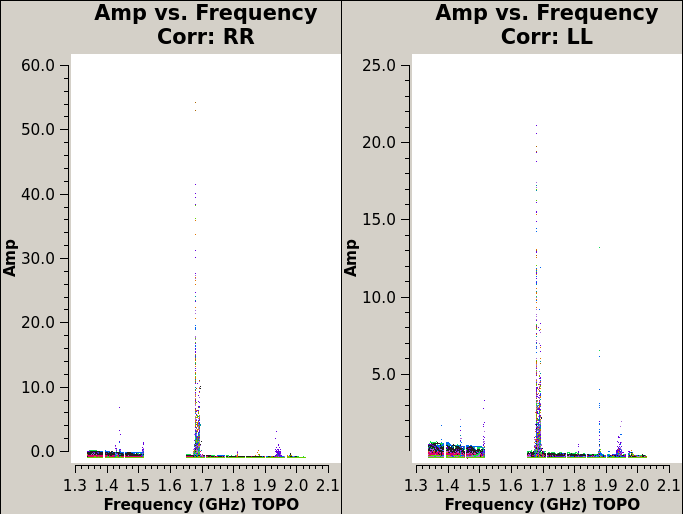

In [133]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

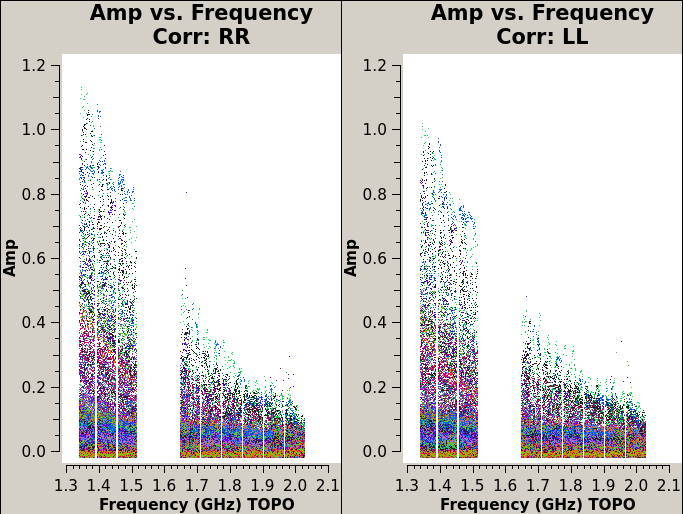

In [134]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [135]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J1344+0128
Before: 59.6793, After: 60.4502

field QSO J1347-0157
Before: 59.8132, After: 60.7479

field QSO J1350-0027
Before: 58.8755, After: 59.9550

field QSO J1416+0015
Before: 60.6170, After: 61.5599

field QSO J1417+0117
Before: 59.1435, After: 59.9279

field QSO J1423-0018
Before: 59.4114, After: 60.4907

field QSO J1425-0015
Before: 60.1951, After: 61.2008

field QSO J1426-0128
Before: 59.2774, After: 60.1079

field QSO J1428-1602
Before: 59.7671, After: 60.6086

field QSO J1429-0002
Before: 58.4737, After: 59.4061

field QSO J1429-0104
Before: 58.7416, After: 59.6721

field QSO J1431-0724
Before: 58.9336, After: 60.1067

field QSO J1440+0107
Before: 60.4488, After: 61.2728

field QSO J1509-1749
Before: 59.5316, After: 60.7057

field QSO J1526-2050
Before: 66.1448, After: 67.1441

field QSO J1558-0724
Before: 60.7509, After: 62.8648

scan 10
Before: 59.1435, After: 59.9279

scan 11
Before: 60.6170, After: 6

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [136]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C286


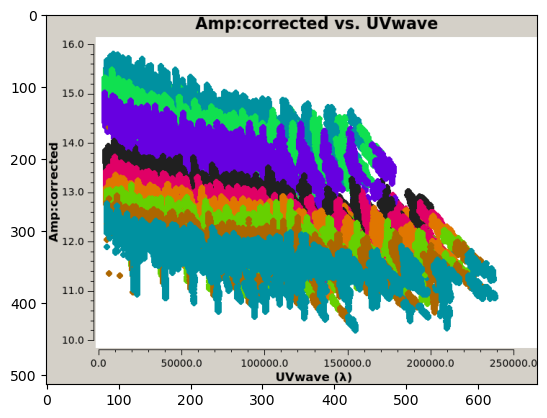

J1354-0206


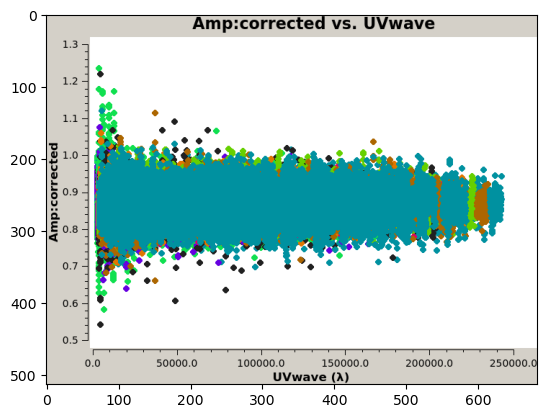

J1404-0130


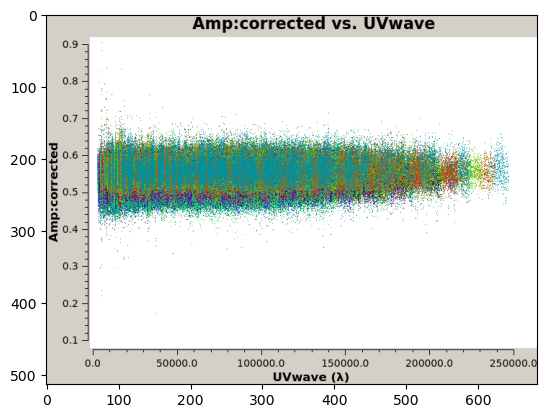

J1408-0752


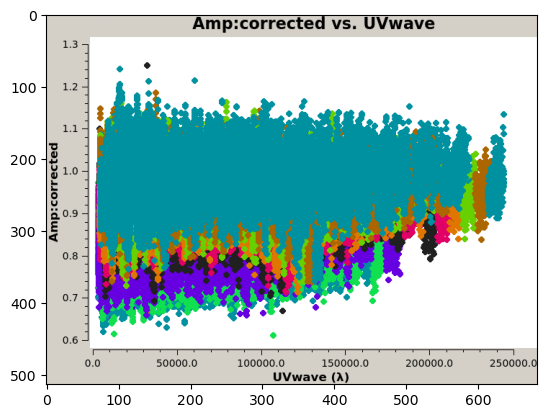

J1432-1801


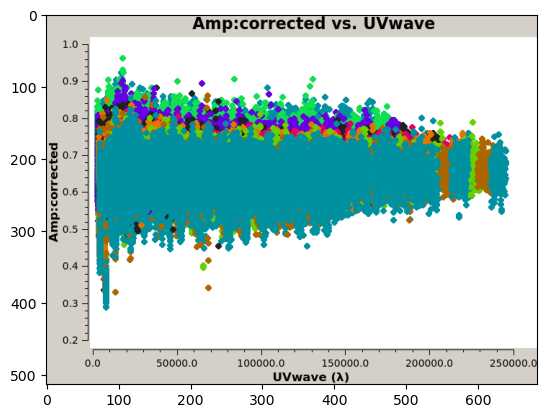

J1507-1652


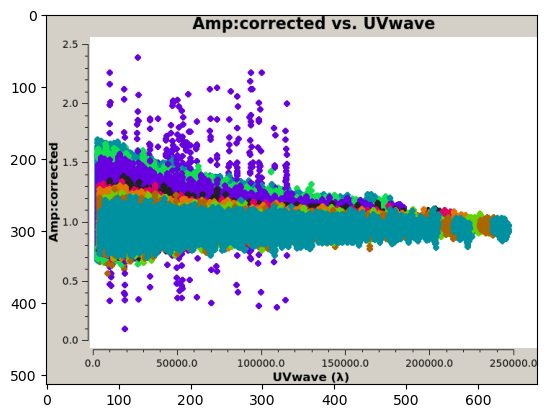

J1543-0757


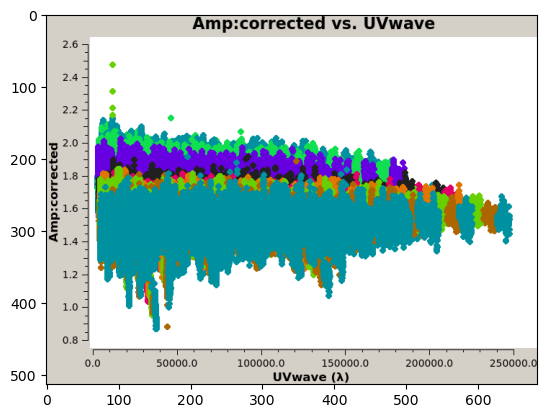

QSO J1344+0128


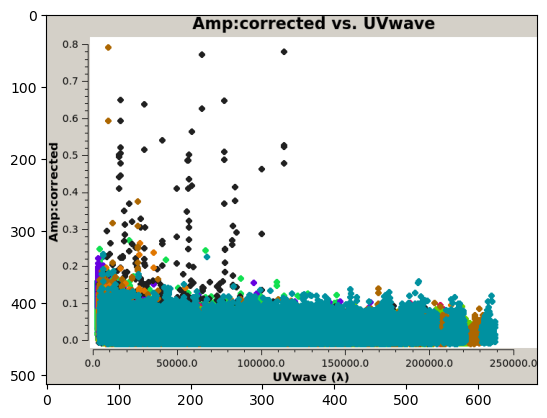

QSO J1347-0157


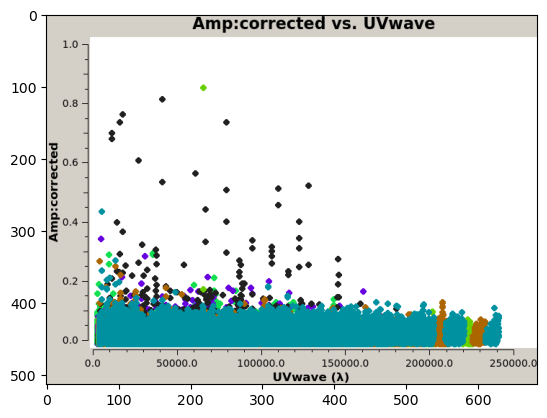

QSO J1350-0027


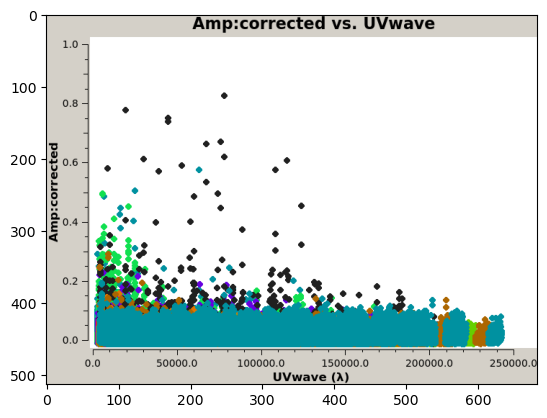

QSO J1417+0117


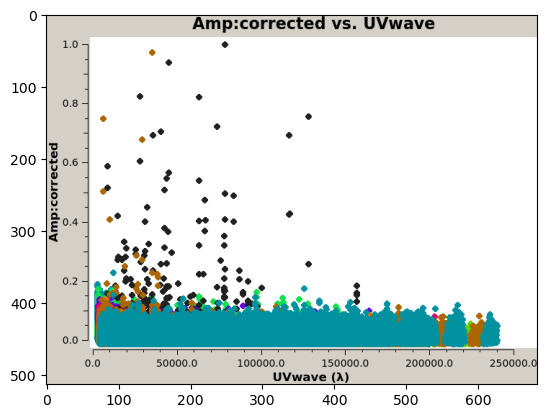

QSO J1416+0015


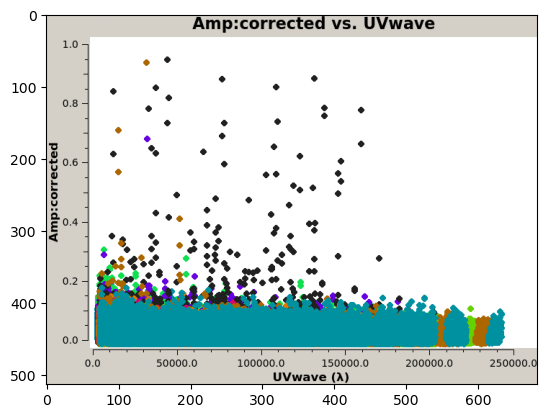

QSO J1423-0018


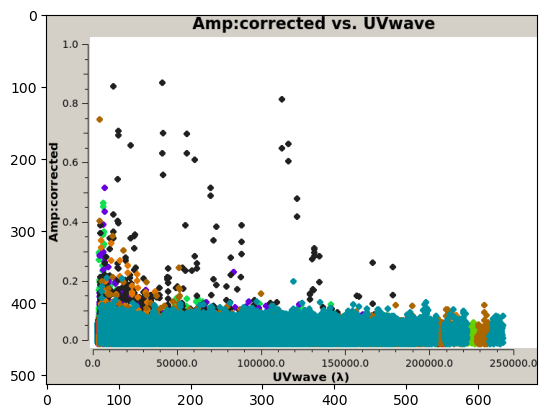

QSO J1425-0015


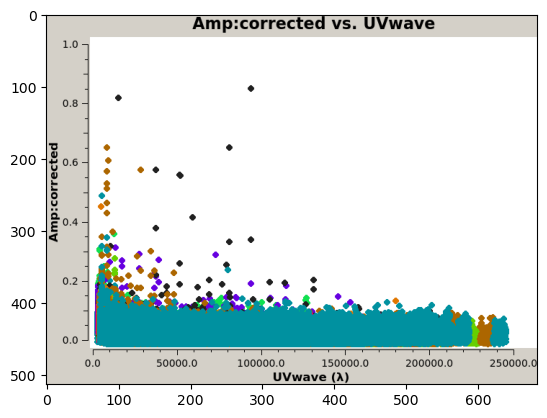

QSO J1429-0104


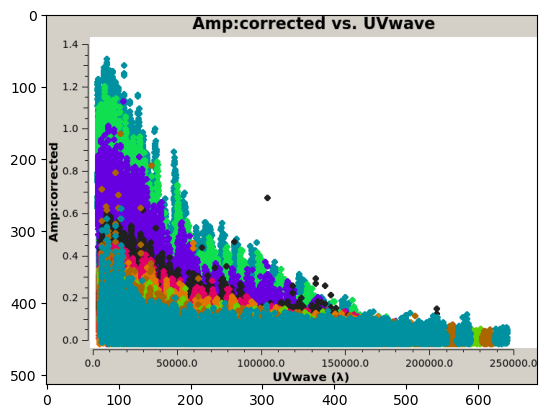

QSO J1429-0002


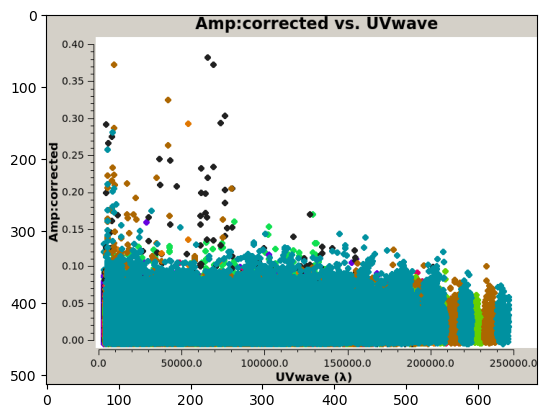

QSO J1440+0107


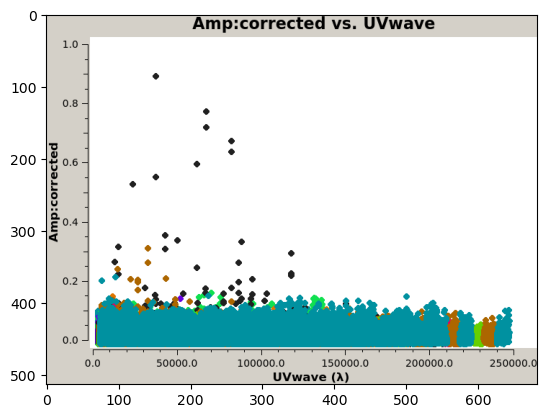

QSO J1426-0128


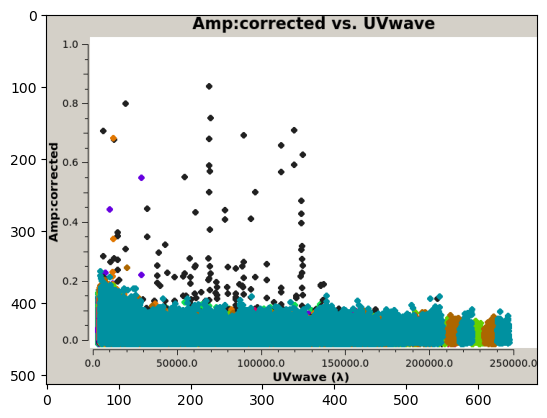

QSO J1431-0724


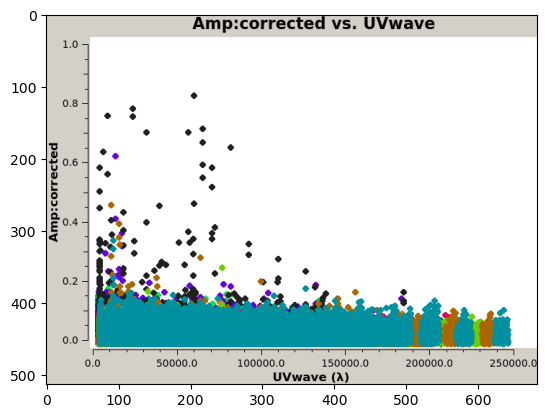

QSO J1428-1602


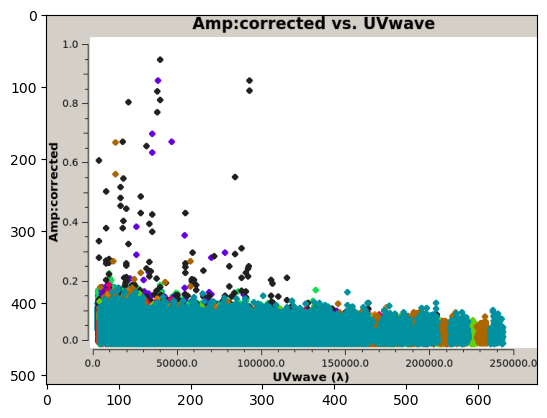

QSO J1509-1749


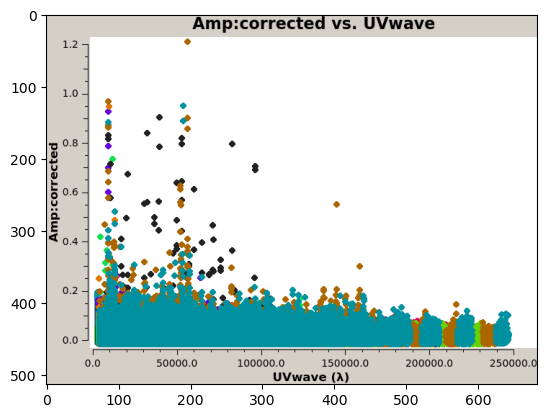

QSO J1526-2050


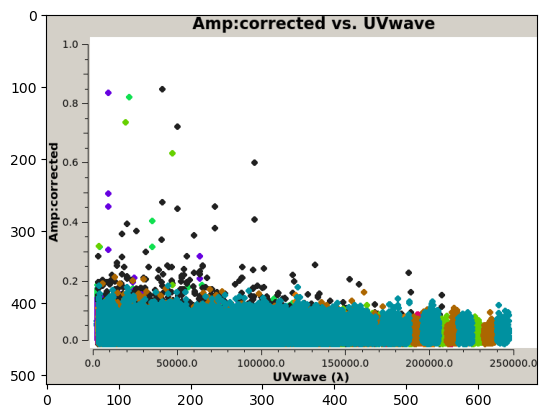

QSO J1558-0724


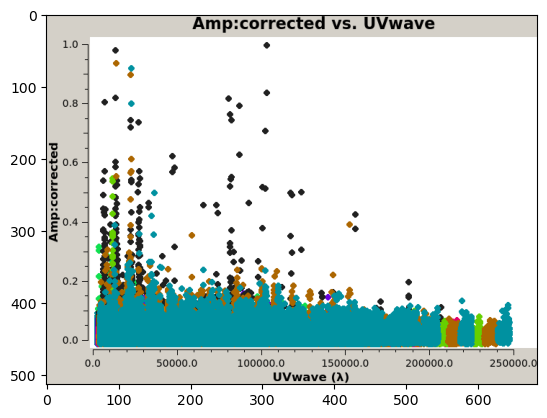

In [137]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


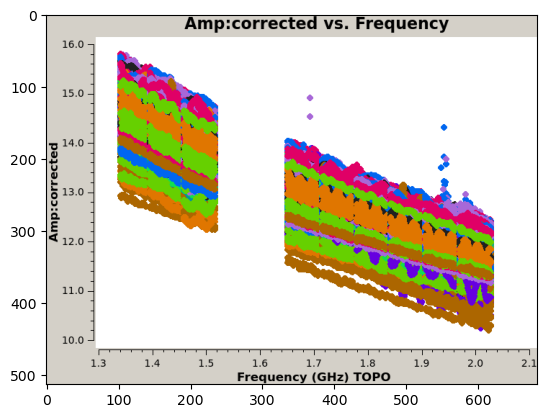

J1354-0206


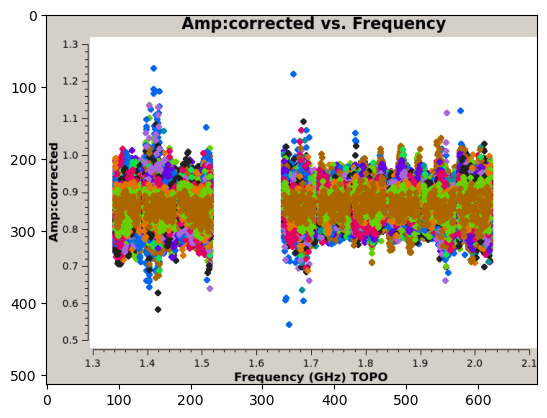

J1404-0130


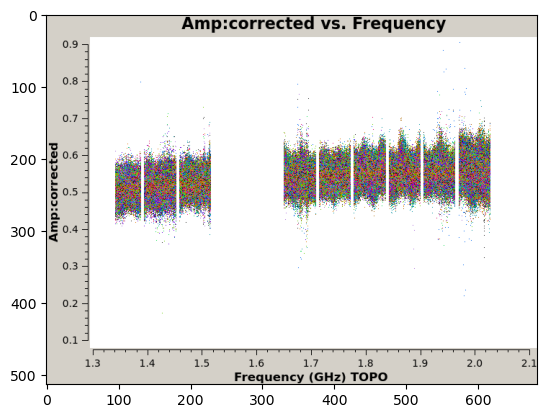

J1408-0752


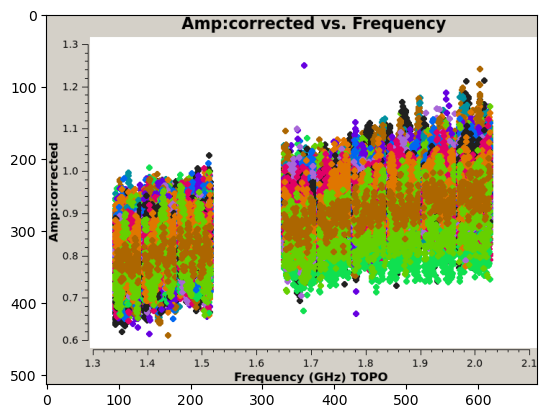

J1432-1801


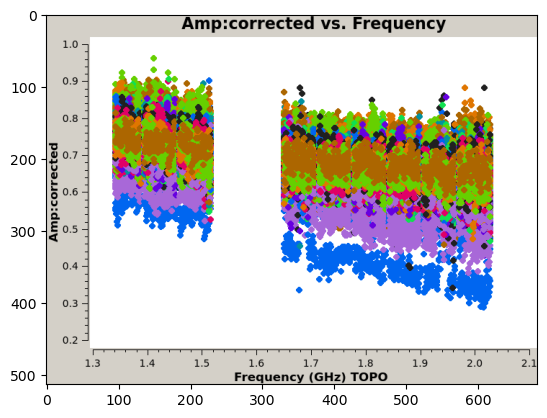

J1507-1652


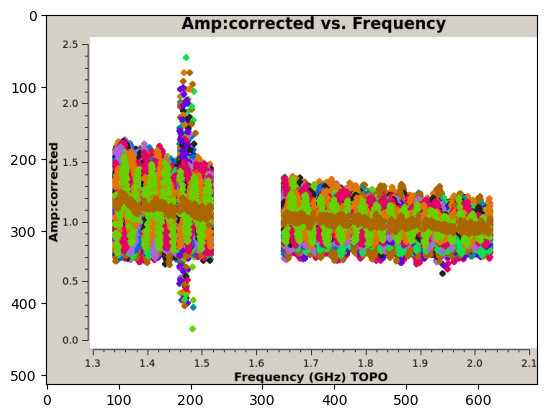

J1543-0757


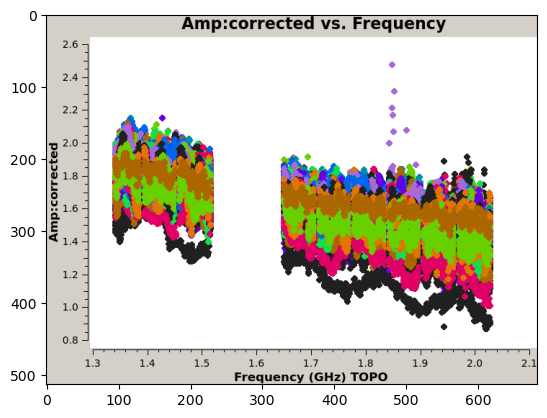

QSO J1344+0128


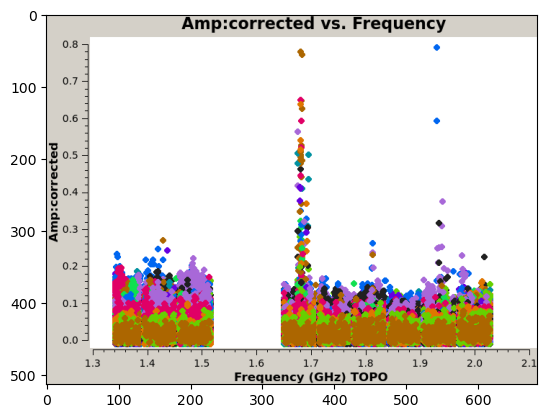

QSO J1347-0157


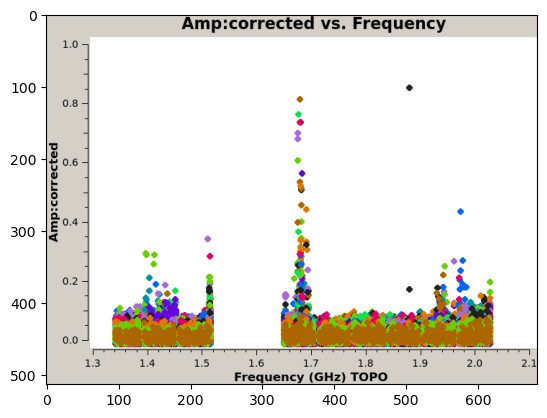

QSO J1350-0027


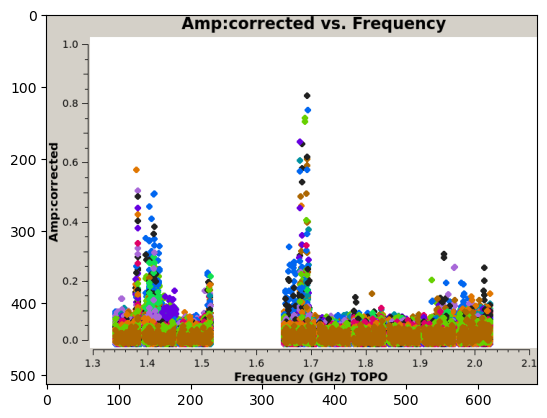

QSO J1417+0117


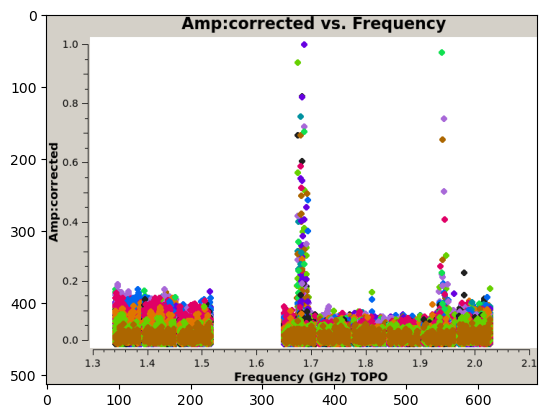

QSO J1416+0015


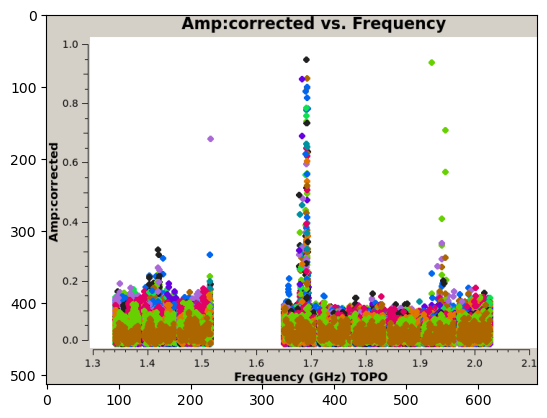

QSO J1423-0018


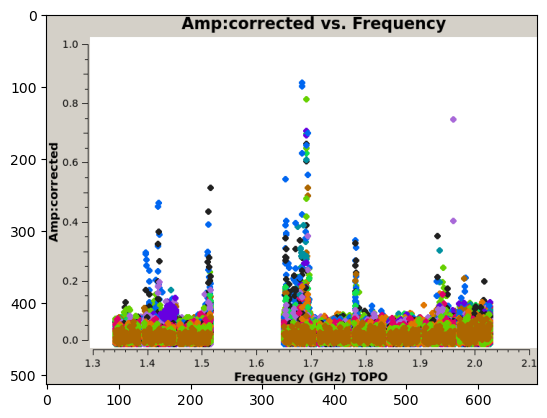

QSO J1425-0015


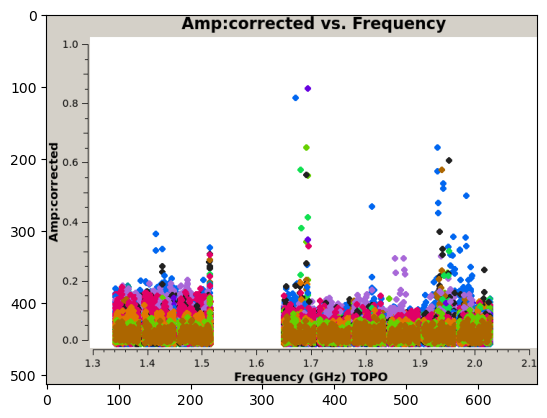

QSO J1429-0104


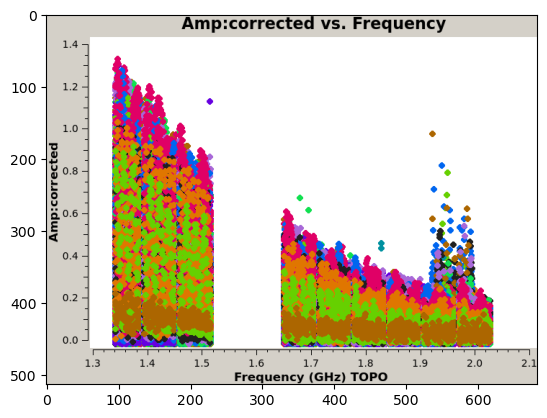

QSO J1429-0002


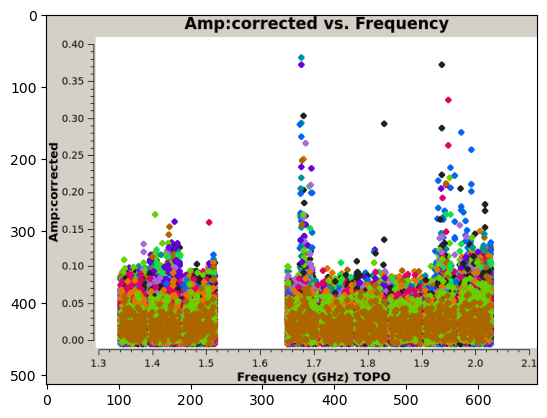

QSO J1440+0107


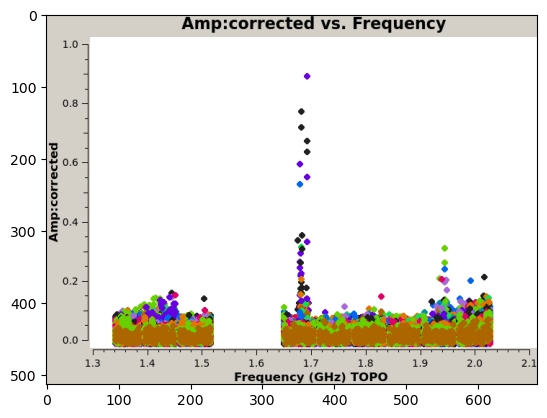

QSO J1426-0128


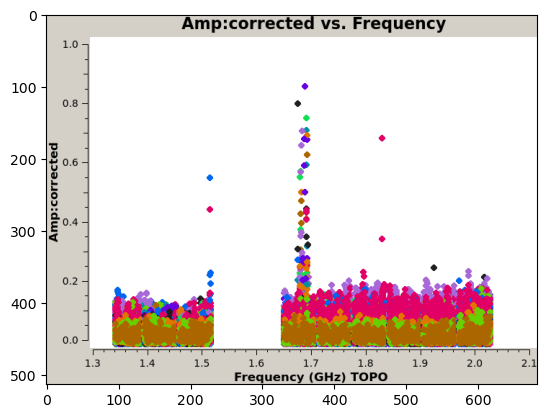

QSO J1431-0724


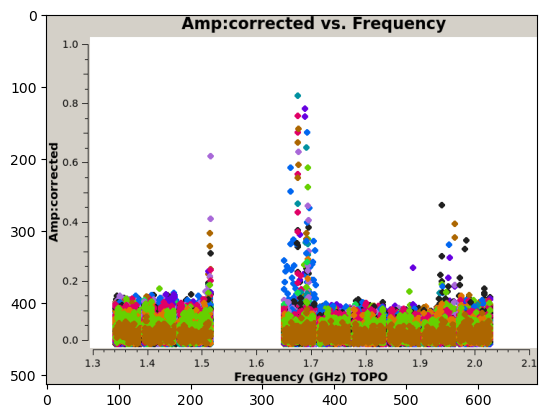

QSO J1428-1602


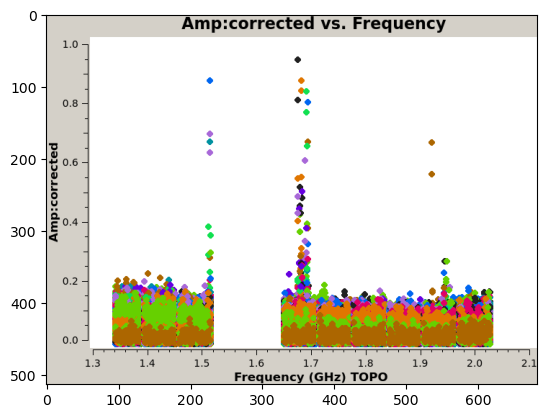

QSO J1509-1749


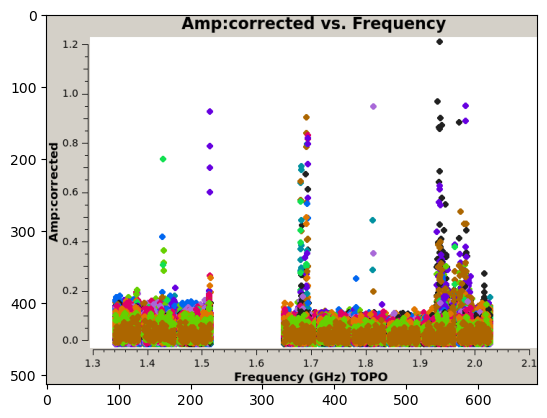

QSO J1526-2050


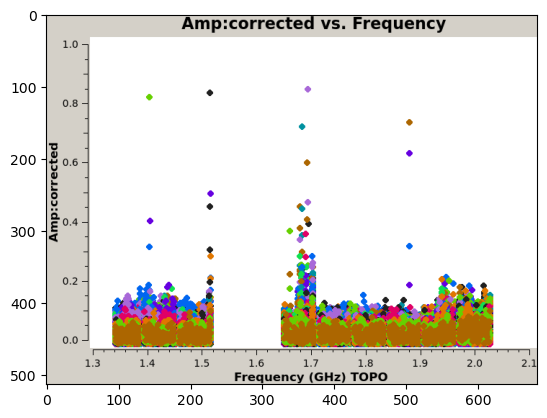

QSO J1558-0724


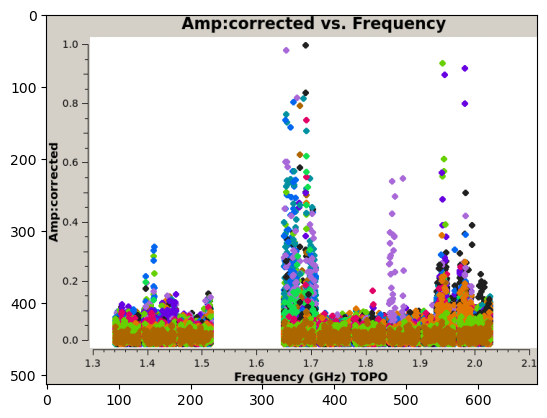

In [138]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


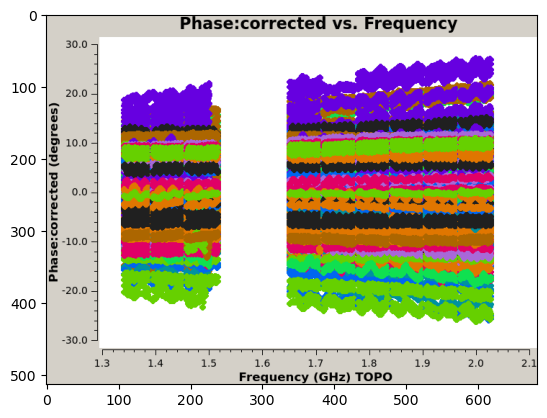

J1354-0206


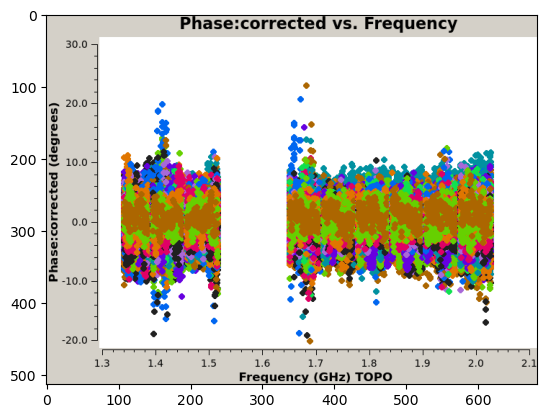

J1404-0130


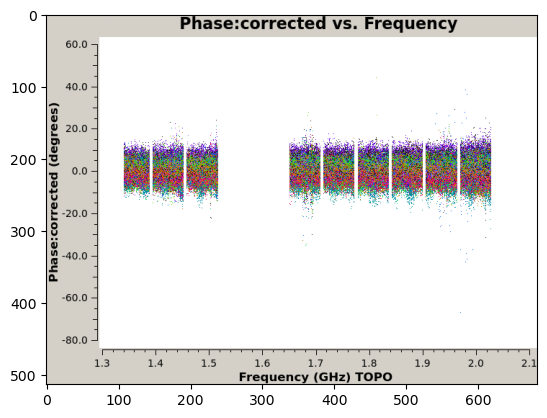

J1408-0752


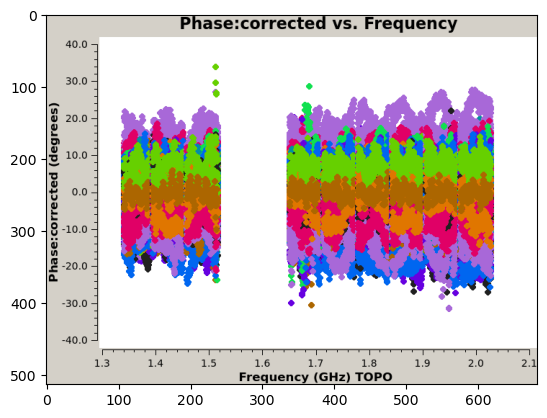

J1432-1801


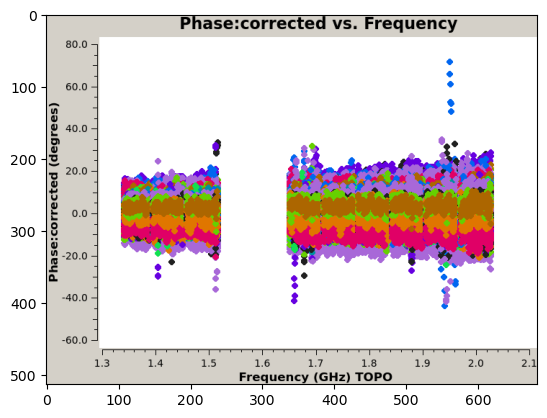

J1507-1652


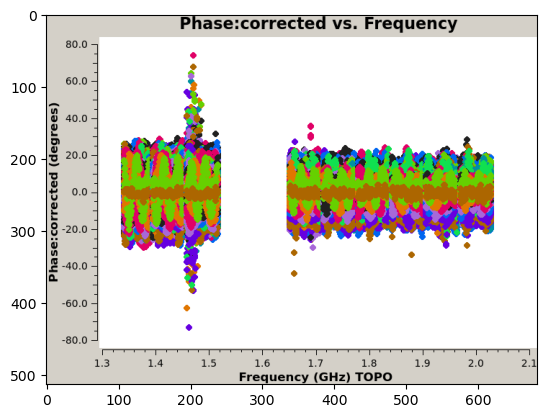

J1543-0757


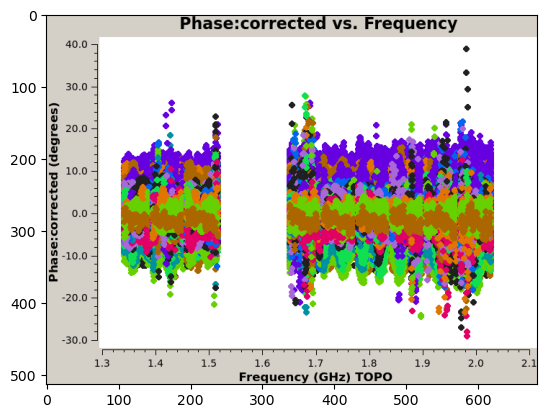

QSO J1344+0128


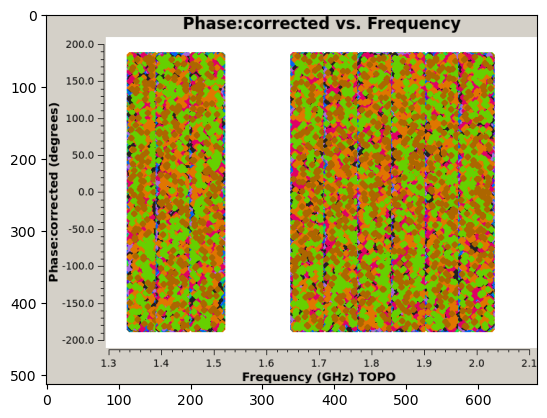

QSO J1347-0157


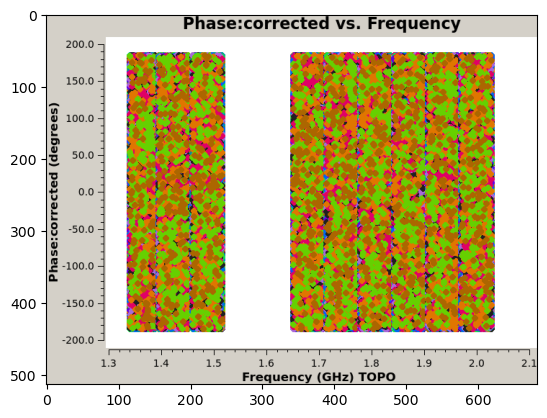

QSO J1350-0027


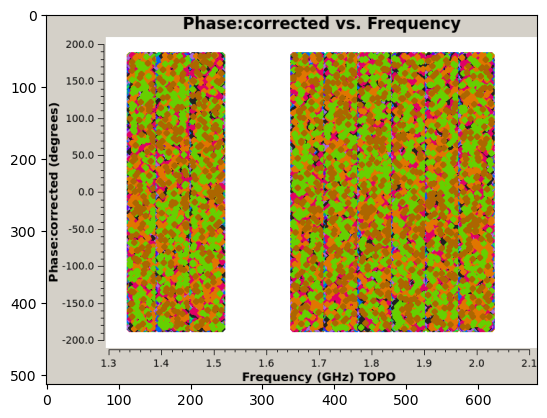

QSO J1417+0117


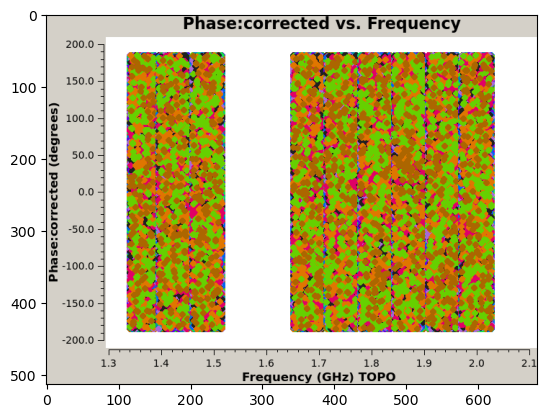

QSO J1416+0015


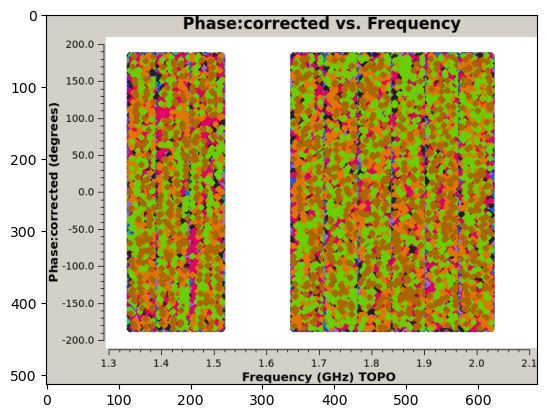

QSO J1423-0018


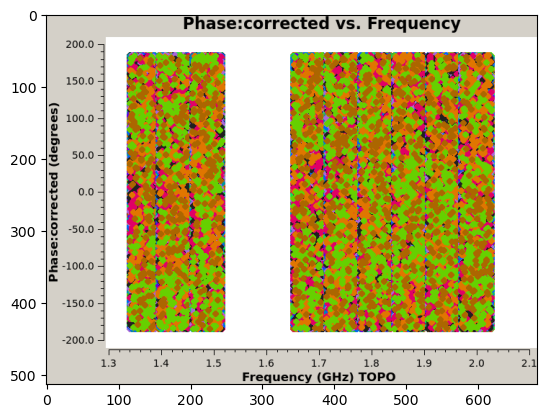

QSO J1425-0015


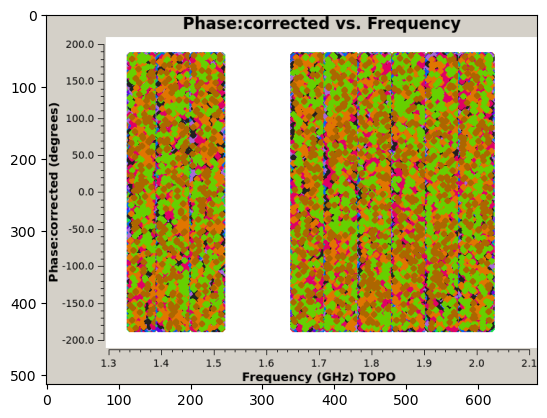

QSO J1429-0104


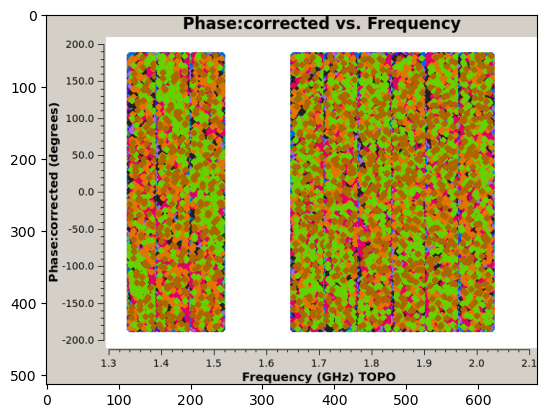

QSO J1429-0002


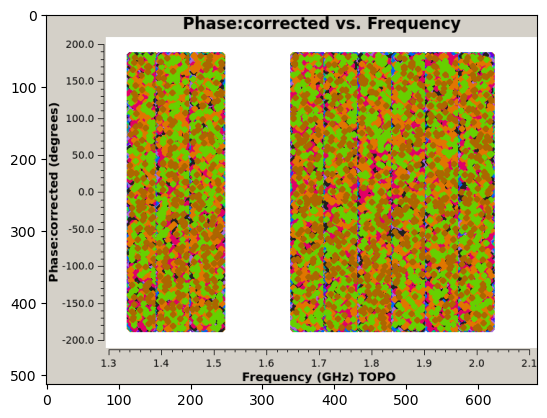

QSO J1440+0107


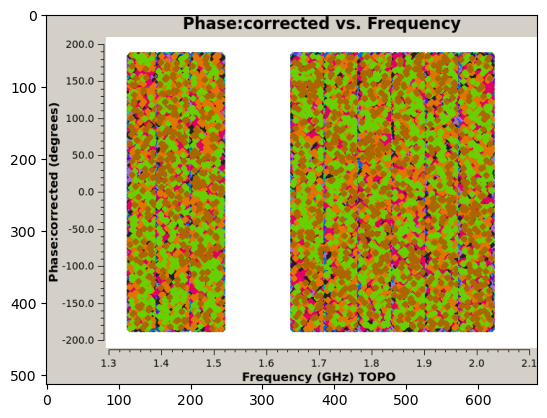

QSO J1426-0128


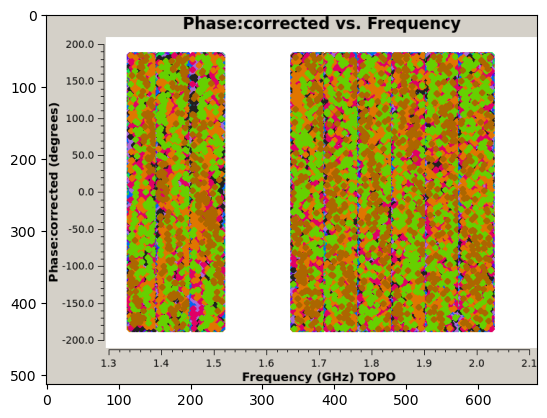

QSO J1431-0724


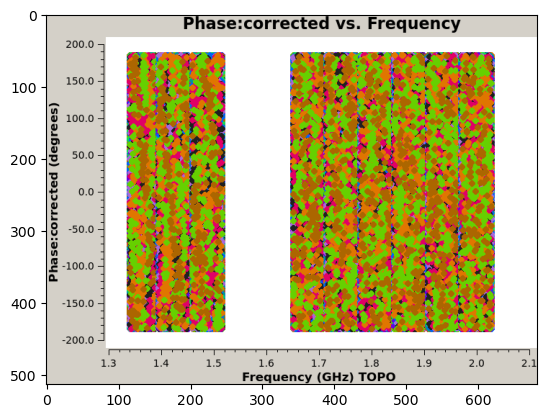

QSO J1428-1602


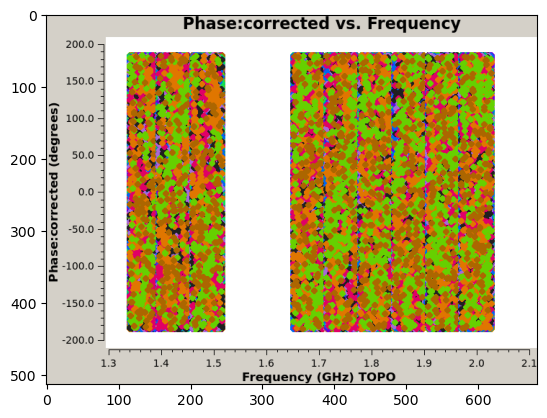

QSO J1509-1749


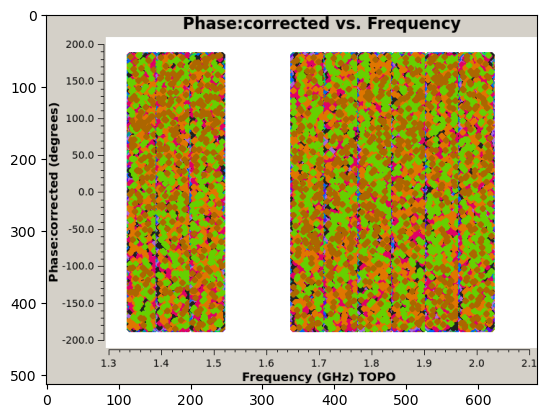

QSO J1526-2050


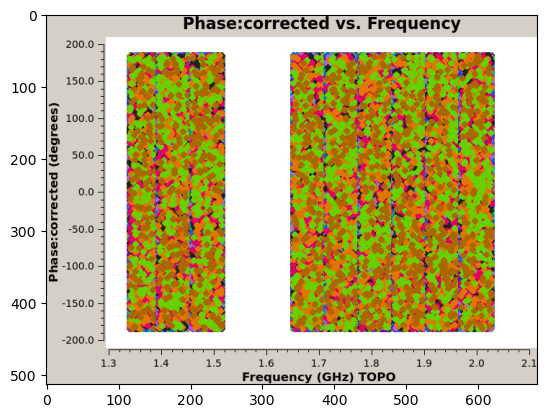

QSO J1558-0724


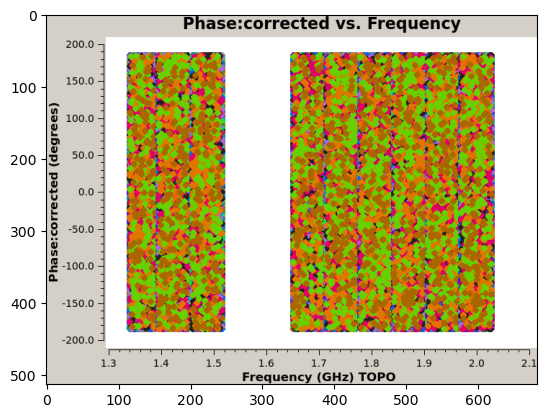

In [139]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [140]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

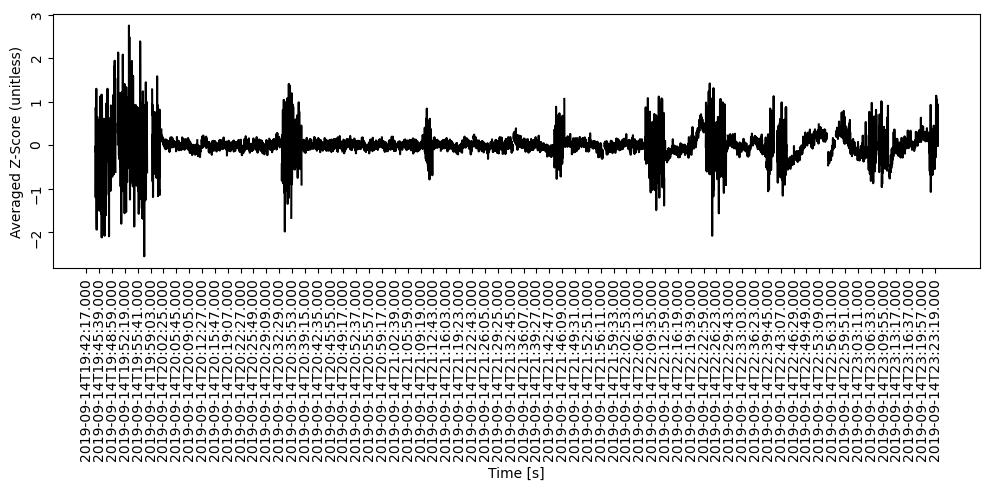

In [141]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

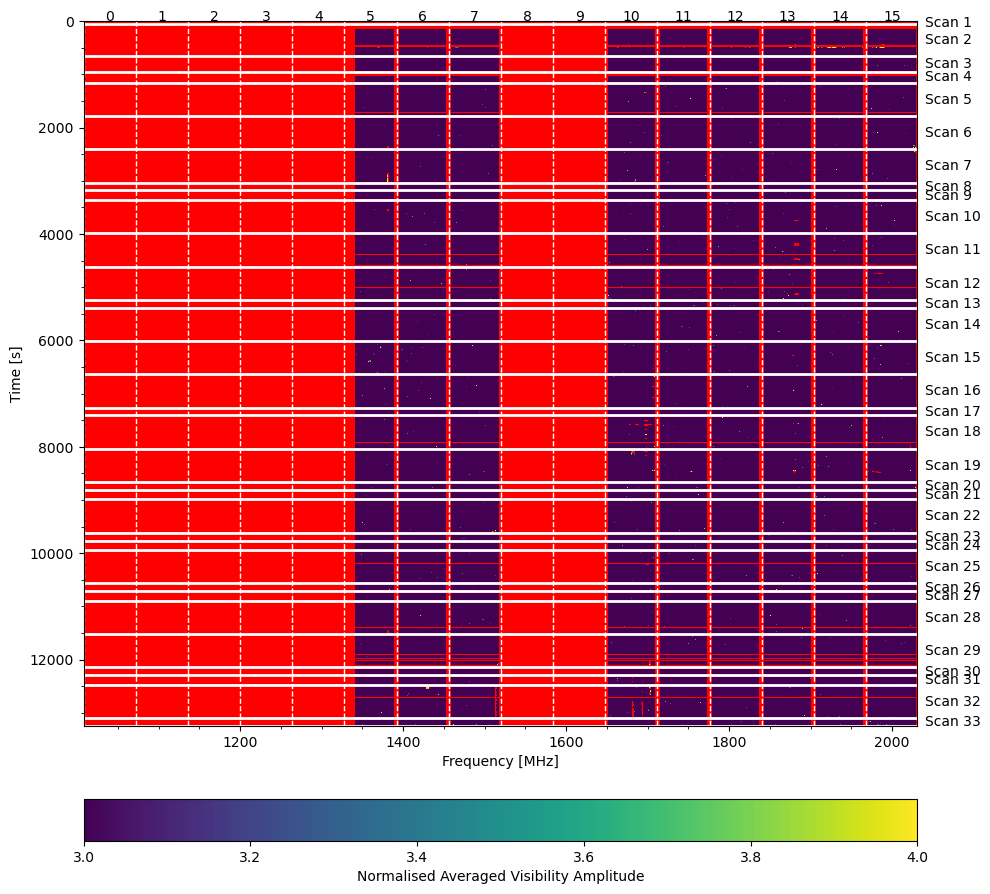

In [142]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")